In [1]:
import rclpy
from pi3hat_moteus_int_msgs.msg import JointsCommand,JointsStates
import rosbag2_api.read_bag as rb
import rosbag2_api.save_csv_file as csv_wrt
import os 
from matplotlib import pyplot as plt
import numpy as np
from statistics import mean,stdev

import mpld3
mpld3.enable_notebook()
# %matplotlib widget

In [2]:
exp_name = 'test_2023_09_05__16_19_05_00'
## with this variable we are actually taking into count all the two tests

## qua non avevamo ancora messo la corrente quindi in 
# /home/mulinexopc/Documents/softlegjump_ws/src/pi3hat_moteus_int_msgs/msg/JointsStates.msg devi commentare la corrente
## concol biuld e poi rilanciare questo notebnok 
a = JointsStates()
a.current

# name_folder = 'bag_14_09_2023/Test_jump_000_vuoto_test_bag'
# name_folder = 'bag_14_09_2023/Test_jump_001_prova_test_bag'
# name_folder = 'bag_14_09_2023/Test_jump_001_gradino_hip_test_bag'
# name_folder = 'bag_14_09_2023/Test_jump_001_gradino_hip_torque_test_bag'
# name_folder = 'bag_14_09_2023/Test_jump_001_gradino_hip_torque_5_test_bag'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_007_ground'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_008_q0_bimbi_ground'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_009_q0_bimbi_ground'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_010_q0_bimbi_ground'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_011_q0_bimbi_ground'
# name_folder = 'bag_19_09_2023/Test_jump_19_09_2023_012_q0_bimbi_ground'
# name_folder = "Test_jump_26_09_2023_000_q0_bimbi_gradino"
# name_folder = "Test_jump_26_09_2023_001_q0_bimbi_gradino"
# name_folder = "Test_jump_26_09_2023_003_q0_bimbi_gradino"
# name_folder = "Test_jump_26_09_2023_010_q0_bimbi_gradino"
# name_folder = "Test_jump_28_09_2023_012_q0"
# name_folder = "Test_jump_28_09_2023_019_q0_gradino"

## da qua abbiamo la velocità nel msg

# name_folder = 'bag_20_09_2023/Test_jump_20_09_2023_000_q0_bimbi_ground_torque'
# name_folder = 'bag_20_09_2023/Test_jump_20_09_2023_000_q0_bimbi_ground'
# name_folder = 'bag_20_09_2023/Test_jump_20_09_2023_003_q0_bimbi_ground_zero_vel' ## non -- male 
# name_folder = 'bag_20_09_2023/Test_jump_20_09_2023_004_q0_bimbi_ground_zero_vel_pos_scale' ## best -- test 
# name_folder = 'Test_jump_21_09_2023_004_q0_bimbi_gradino'
# name_folder = 'Test_jump_21_09_2023_001_q0_bimbi_gradino'
name_folder = 'bag_21_09_2023/Test_jump_21_09_2023_002_q0_bimbi_gradino'  ## best test -- gradino 


## nuovi test controllo ottimo 
# name_folder = 'Test_jump_17_10_2023_019_q0'
# name_folder = 'Test_jump_17_10_2023_019_q0_5_ff'

AttributeError: 'JointsStates' object has no attribute 'current'

In [ ]:
act_path  = os.path.join(os.path.expanduser("~"),"Documents")
mul_env_path = os.path.join(os.path.expanduser("~"),"Documents","softlegjump_ws")
stt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"stt_"+exp_name,"stt_"+exp_name+"_0.db3")
cmd_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"cmd_"+exp_name,"cmd_"+exp_name+"_0.db3")
per_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"per_"+exp_name,"per_"+exp_name+"_0.db3")

In [ ]:
print(stt_bag_path)
print(os.path.exists(stt_bag_path))
print(os.path.exists(cmd_bag_path))
print(os.path.exists(per_bag_path))

/home/mulinexopc/Documents/softlegjump_ws/Test_jump_17_10_2023_019_q0_5_ff_test_bag/stt_test_2023_09_05__16_19_05_00/stt_test_2023_09_05__16_19_05_00_0.db3
False
False
False


In [ ]:
stt_msgs = rb.read_from_all_topics(stt_bag_path)
stt_msg = stt_msgs[0][3]

jnt_num = len(stt_msg[0].name)
stt_num = len(stt_msgs[0][2])

msr_times = np.full(stt_num,0.0)
# for i in range(stt_num):
#     print(stt_msg[i].header.stamp.sec)
msr_pos = np.full((stt_num,jnt_num),0.0)
msr_vel = np.full((stt_num,jnt_num),0.0)
msr_eff = np.full((stt_num,jnt_num),0.0)
msr_temp = np.full((stt_num,jnt_num),0.0)
msr_curr = np.full((stt_num,jnt_num),0.0)
msr_count = np.full(stt_num,0.0)
msr_sec_end_pos = np.full((stt_num,jnt_num),0.0)

for i in range(stt_num):
    # print(stt_msg[i].header.stamp.sec,stt_msg[i].header.stamp.nanosec)
    msr_times[i] = stt_msg[i].header.stamp.sec + stt_msg[i].header.stamp.nanosec/pow(10,9)
    for j in range(jnt_num):
        msr_pos[i][j] = stt_msg[i].position[j]
        msr_vel[i][j] = stt_msg[i].velocity[j]
        msr_eff[i][j] = stt_msg[i].effort[j]
        msr_temp[i][j] = stt_msg[i].temperature[j]
        msr_curr[i][j] = stt_msg[i].current[j]
        msr_sec_end_pos[i][j] = stt_msg[i].sec_enc_pos[j]

OperationalError: unable to open database file

In [ ]:
cmd_msgs = rb.read_from_all_topics(cmd_bag_path)
cmd_msg = cmd_msgs[0][3]

jnt_num = len(cmd_msg[0].name)
cmd_num = len(cmd_msgs[0][2])

cmd_times = cmd_msgs[0][2]
# for i in range(stt_num):
#     print(stt_msg[i].header.stamp.sec)
cmd_pos = np.full((cmd_num,jnt_num),0.0)
cmd_vel = np.full((cmd_num,jnt_num),0.0)
cmd_eff = np.full((cmd_num,jnt_num),0.0)
# cmd_kp = np.full((cmd_num,jnt_num),0.0)

for i in range(cmd_num):
    # print(stt_msg[i].header.stamp.sec,stt_msg[i].header.stamp.nanosec)
    cmd_times[i] = cmd_times[i]/pow(10, 9)#  cmd_msg[i].header.stamp.sec + cmd_msg[i].header.stamp.nanosec/pow(10,9)
    for j in range(jnt_num):
        cmd_pos[i][j] = cmd_msg[i].position[j]
        cmd_vel[i][j] = cmd_msg[i].velocity[j]
        # cmd_eff[i][j] = cmd_msg[i].effort[j]
        # msr_temp[i][j] = stt_msg[i].temperature[j]

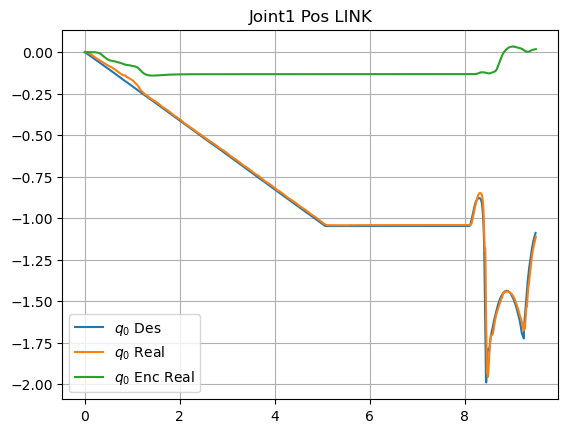

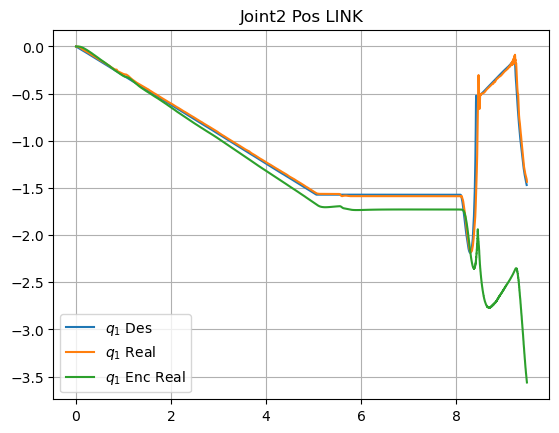

In [ ]:
for  i in range(2):
    n = i+1
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(n) +"_plot.svg")
    plt.plot(np.array(cmd_times) - np.array(cmd_times[0]), cmd_pos[:,i],linewidth=1.5, label=r'$q_{'+str(i)+'}$ Des')
    plt.plot(np.array(msr_times) - np.array(msr_times[0]), msr_pos[:,i],linewidth=1.5 ,label=r'$q_{'+str(i)+'}$ Real')
    plt.plot(np.array(msr_times) - np.array(msr_times[0]), msr_sec_end_pos[:,i],linewidth=1.5, label=r'$q_{'+str(i)+'}$ Enc Real')
    # plt.savefig("prova",format="svg")
    plt.title('Joint' + str(i+1)+' Pos LINK')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

    

In [ ]:
# print('init' , cmd_pos[5000,0], cmd_pos[5000,1])
# print('final ', cmd_pos[-1,0], cmd_pos[-1,1])

print('init' , np.rad2deg(cmd_pos[6000,0]), np.rad2deg(cmd_pos[6000,1]))
print('final ', np.rad2deg(cmd_pos[-1,0]), np.rad2deg(cmd_pos[-1,1]))

init -59.998409533011646 -90.00419633015338
final  -62.39029467829409 -84.14285822191519


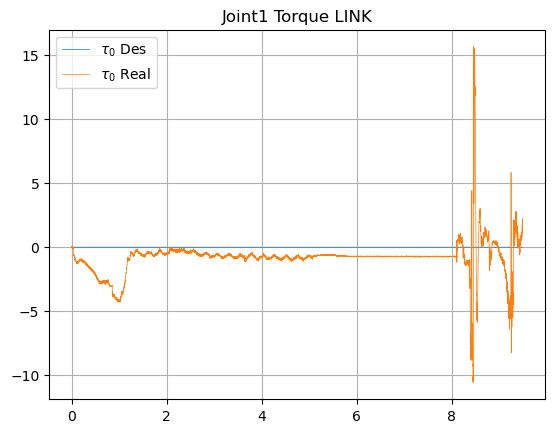

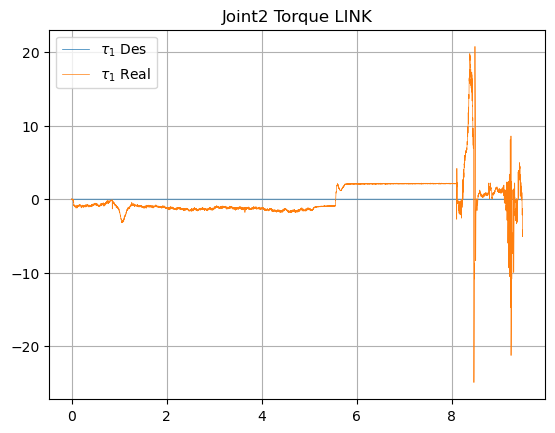

In [ ]:
for  i in range(2):
    n = i+1
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(n) +"_plot_eff.svg")
    plt.plot(np.array(cmd_times) - np.array(cmd_times[0]), cmd_eff[:,i],linewidth=0.5, label=r'$\tau_{'+str(i)+'}$ Des')
    plt.plot(np.array(msr_times) - np.array(msr_times[0]), msr_eff[:,i],linewidth=0.5 ,label=r'$\tau_{'+str(i)+'}$ Real')
    # plt.savefig("prova",format="svg")
    plt.title('Joint' + str(i+1)+' Torque LINK')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

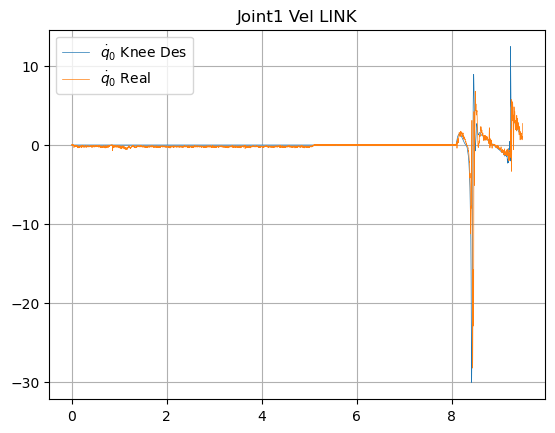

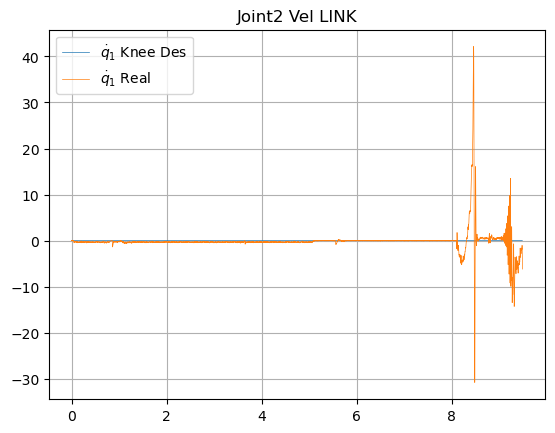

In [ ]:
for  i in range(2):
    n = i+1
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(n) +"_vel_plot.svg")
    plt.plot(np.array(cmd_times) - np.array(cmd_times[0]), cmd_vel[:,i],linewidth=0.5, label=r'$\dot{q}_{'+str(i)+'}$ Knee Des')
    plt.plot(np.array(msr_times) - np.array(msr_times[0]), msr_vel[:,i],linewidth=0.5 ,label=r'$\dot{q}_{'+str(i)+'}$ Real')
    plt.title('Joint' + str(i+1)+' Vel LINK')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

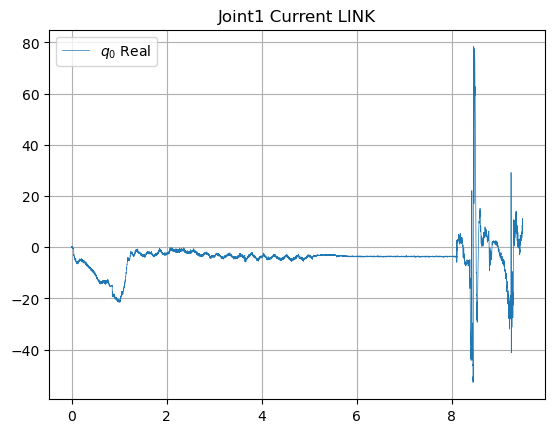

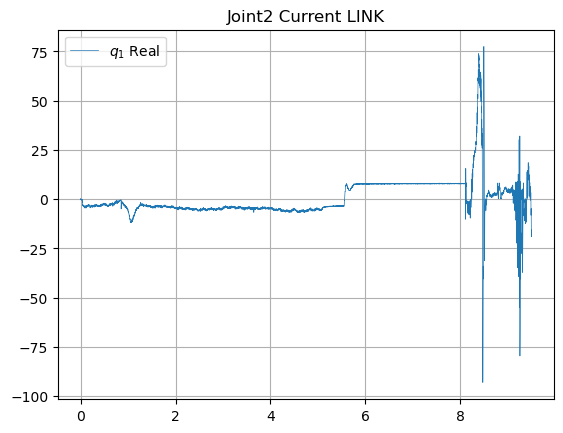

In [ ]:
for  i in range(2):
    n = i+1
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(n) +"_plot_cur.svg")
    # plt.plot(np.array(cmd_times) - np.array(cmd_times[0]), cmd_pos[:,i],linewidth=0.5, label=r'$q_{'+str(i)+'}$ Knee Des')
    plt.plot(np.array(msr_times) - np.array(msr_times[0]), msr_curr[:,i],linewidth=0.5 ,label=r'$q_{'+str(i)+'}$ Real')
    # plt.savefig("prova",format="svg")
    plt.title('Joint' + str(i+1)+' Current LINK')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

In [ ]:
print('Real Time Task:\n\n\tHoming 5 sec\n\tTask sec', np.around(-msr_times[0] + msr_times[-1] - 5, decimals=4))
print('dt:\n\tMeas: {}\n\tSend {} [sec]'.format(np.around((-msr_times[0] + msr_times[-1])/len(msr_times), decimals=4), 
                                                np.around((cmd_times[-1] - cmd_times[0])/len(cmd_times), decimals=4) ))

Real Time Task:

	Homing 5 sec
	Task sec 4.494
dt:
	Meas: 0.001
	Send 0.001 [sec]


In [ ]:
# import pandas

# csv_dic = {"time": msr_times, "count" : msr_count, "msr_pos": msr_pos[:,0], "msr_vel": msr_vel[:,0], "msr_eff": msr_eff[:,0], "msr_temp":msr_temp[:,0],}
# df = pandas.DataFrame(csv_dic)
# df.to_csv("msr_"+exp_name+"_c2.csv")

# csv_dic = {"time": msr_times, "count" : msr_count, "msr_pos": msr_pos[:,1], "msr_vel": msr_vel[:,1], "msr_eff": msr_eff[:,1], "msr_temp":msr_temp[:,1]}
# df = pandas.DataFrame(csv_dic)
# df.to_csv("msr_"+exp_name+"_c3.csv")

# csv_dic = {"time": cmd_times,  "cmd_eff": cmd_eff[:,0]}
# df = pandas.DataFrame(csv_dic)
# df.to_csv("cmd_"+exp_name+"_c2.csv")

# csv_dic = {"time": cmd_times, "cmd_eff": cmd_eff[:,1]}
# df = pandas.DataFrame(csv_dic)
# df.to_csv("cmd_"+exp_name+"_c3.csv")

In [ ]:
cmd_times = np.array(cmd_times) - np.array(cmd_times)[0]
msr_times = np.array(msr_times) - np.array(msr_times)[0]

cond_cmd = np.logical_and(cmd_times > 8.0, cmd_times < 10.0)
cond_msr = np.logical_and(msr_times > 8.0, msr_times < 10.0)

index_cmd = np.where(cond_cmd)[0]
index_msr = np.where(cond_msr)[0]


/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


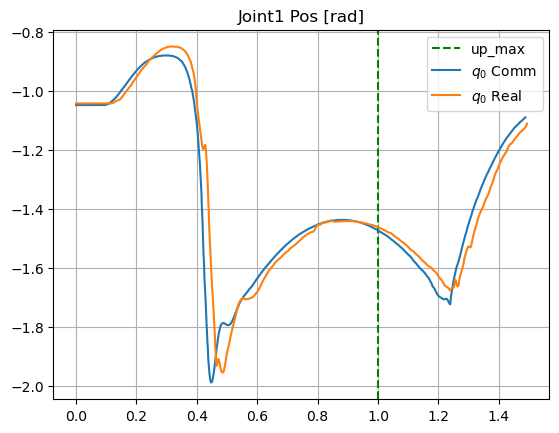

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


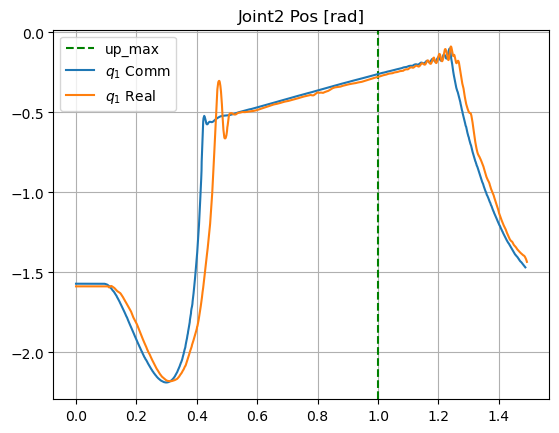

In [ ]:
line_write = 'up_max'

for  i in range(2):
    fig, ax = plt.subplots()
    ax.axvline(x=1, color='g', linestyle='--', label=line_write)
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(i + 1) +"_plot.svg")
    plt.plot(cmd_times[index_cmd] - cmd_times[index_cmd[0]], cmd_pos[index_cmd,i],linewidth=1.5, label=r'$q_{'+str(i)+'}$ Comm')
    plt.plot(msr_times[index_msr] - msr_times[index_msr[0]], msr_pos[index_msr,i],linewidth=1.5,label=r'$q_{'+str(i)+'}$ Real')
    plt.title('Joint' + str(i + 1) + ' Pos [rad]')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show() 

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


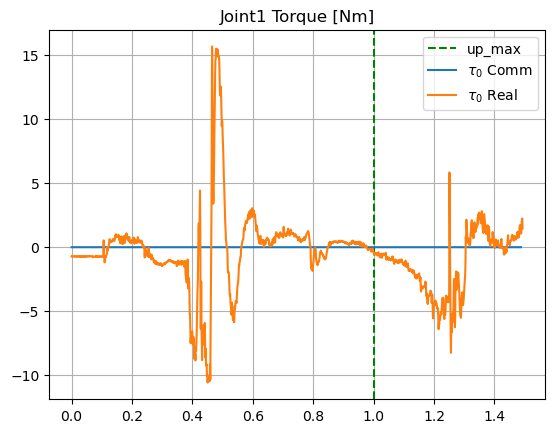

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


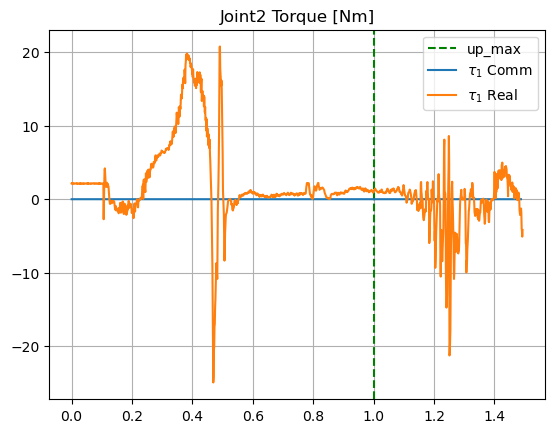

In [ ]:
for  i in range(2):
    fig, ax = plt.subplots()
    ax.axvline(x=1, color='g', linestyle='--', label=line_write)
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(i + 1) +"_plot_eff.svg")
    plt.plot(cmd_times[index_cmd] - cmd_times[index_cmd[0]], cmd_eff[index_cmd,i],linewidth=1.5, label=r'$\tau_{'+str(i)+'}$ Comm')
    plt.plot(msr_times[index_msr] - msr_times[index_msr[0]], msr_eff[index_msr,i],linewidth=1.5,label=r'$\tau_{'+str(i)+'}$ Real')
    plt.title('Joint' + str(i+1) + ' Torque [Nm]')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


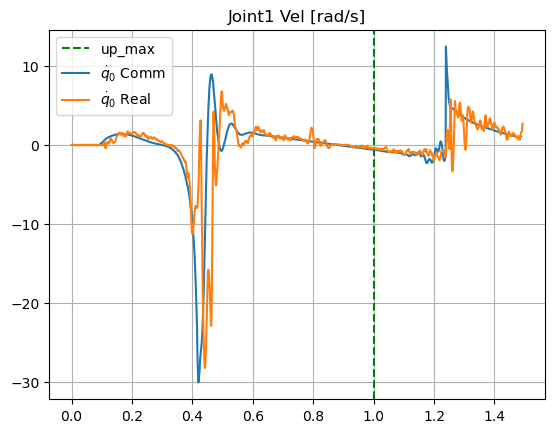

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


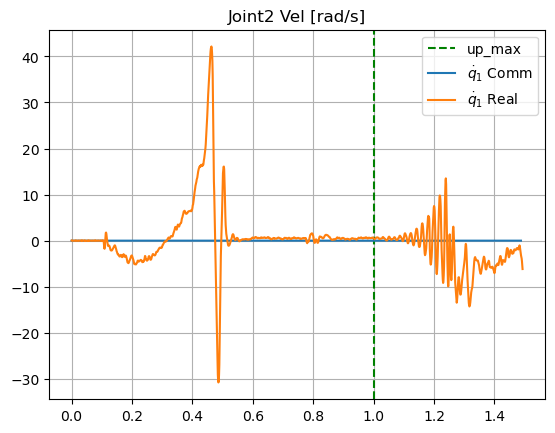

In [ ]:
for  i in range(2):
    fig, ax = plt.subplots()
    ax.axvline(x=1, color='g', linestyle='--', label=line_write)
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(i + 1) +"_vel_plot.svg")
    plt.plot(cmd_times[index_cmd] - cmd_times[index_cmd[0]], cmd_vel[index_cmd,i],linewidth=1.5, label=r'$\dot{q}_{'+str(i)+'}$ Comm')
    plt.plot(msr_times[index_msr] - msr_times[index_msr[0]], msr_vel[index_msr,i],linewidth=1.5,label=r'$\dot{q}_{'+str(i)+'}$ Real')
    plt.title('Joint' + str(i+1) + ' Vel [rad/s]')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


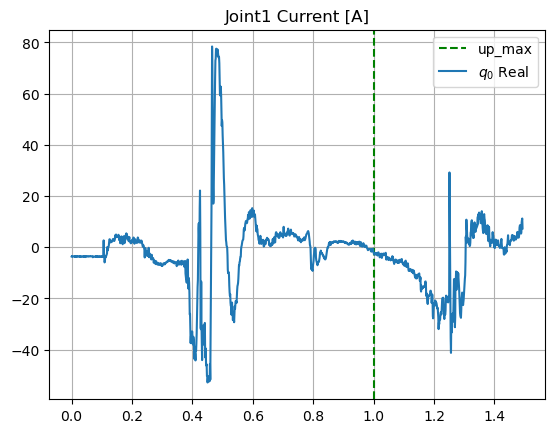

/home/mulinexopc/.local/lib/python3.10/site-packages/mpld3/mplexporter/exporter.py:84: UserWarning: Blended transforms not yet supported. Zoom behavior may not work as expected.
  warnings.warn("Blended transforms not yet supported. "


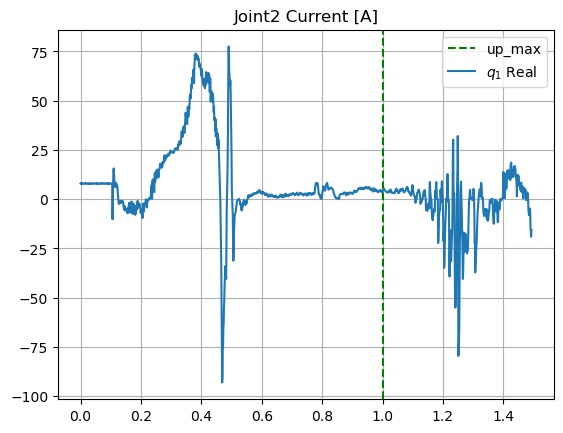

In [ ]:
for  i in range(2):
    fig, ax = plt.subplots()
    ax.axvline(x=1, color='g', linestyle='--', label=line_write)
    plt_bag_path = os.path.join(mul_env_path,name_folder+'_test_bag',"JNT"+ str(i + 1) +"_plot_cur.svg")
    plt.plot(msr_times[index_msr] - msr_times[index_msr[0]], msr_curr[index_msr,i],linewidth=1.5, label=r'$q_{'+str(i)+'}$ Real')
    plt.title('Joint' + str(i+1) + ' Current [A]')
    plt.legend()
    plt.grid()
    plt.savefig(plt_bag_path)
    plt.show()